In [1]:
import sys
import xarray as xr
import numpy as np
import pandas as pd
import math
import glob
import yaml
import geopandas as gpd
import cartopy
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar # different way to handle colorbar
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# cartopy
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
import cartopy.feature as cfeature
import dask

# import personal modules
# Path to modules
sys.path.append('../modules')
# Import my modules
from utils import roundPartial, select_months_ds
from plotter import draw_basemap, plot_terrain, plot_arscale_cbar
from colorline import colorline
from trajectory_post_funcs import calculate_heatmaps_from_trajectories
import customcmaps as ccmaps

dask.config.set(**{'array.slicing.split_large_chunks': True})

ERROR 1: PROJ: proj_create_from_database: Open of /home/dnash/miniconda3/envs/SEAK-impacts/share/proj failed


In [2]:
server='expanse'
if server == 'comet':
    path_to_data = '/data/projects/Comet/cwp140/'
elif server == 'expanse':
    path_to_data = '/expanse/nfs/cw3e/cwp140/'
elif server == 'skyriver':
    path_to_data = '/home/dnash/comet_data/'
path_to_out  = '../out/'       # output files (numerical results, intermediate datafiles) -- read & write
path_to_figs = '../figs/'      # figures

In [3]:
HUC8_ID = '14050001'
HUC8_lbl = 'Upper Yampa'
fname = path_to_data + 'preprocessed/ERA5_trajectories/combined/PRISM_HUC8_{0}.nc'.format(HUC8_ID)
ds = xr.open_dataset(fname)
ds['ar_scale'] = ds.ar_scale.fillna(0) 

ds

<xarray.Dataset>
Dimensions:             (index: 72, start_date: 2056)
Coordinates:
  * index               (index) int64 0 1 2 3 4 5 6 7 ... 65 66 67 68 69 70 71
    time                (start_date, index) datetime64[ns] ...
  * start_date          (start_date) datetime64[ns] 2000-01-05 ... 2023-12-24
    lon                 (start_date, index) float64 ...
    lat                 (start_date, index) float64 ...
Data variables: (12/18)
    level               (start_date, index) float64 ...
    q                   (start_date, index) float64 ...
    u                   (start_date, index) float64 ...
    v                   (start_date, index) float64 ...
    w                   (start_date, index) float64 ...
    IVT                 (start_date, index) float64 ...
    ...                  ...
    coastal_IVT         (start_date) float64 ...
    ar_scale_strict     (start_date) float64 ...
    ar_strict           (start_date) float64 ...
    tARget_strict       (start_date) float64 ...
    coastal_IVT_strict  (start_date) float64 ...
    time_match          (start_date) <U13 ...

In [5]:
ds.where(ds.ar_scale > 0, drop=True)
# ds.where(ds.ar == 1, drop=True)
# ds.where(ds.tARget > 0, drop=True)
# ds.where(ds.coastal_IVT >= 250., drop=True)

<xarray.Dataset>
Dimensions:             (start_date: 412, index: 72)
Coordinates:
  * index               (index) int64 0 1 2 3 4 5 6 7 ... 65 66 67 68 69 70 71
    time                (start_date, index) datetime64[ns] ...
  * start_date          (start_date) datetime64[ns] 2000-01-19 ... 2023-12-09
    lon                 (start_date, index) float64 ...
    lat                 (start_date, index) float64 ...
Data variables: (12/18)
    level               (start_date, index) float64 700.0 729.0 ... 841.1 857.1
    q                   (start_date, index) float64 4.485 4.678 ... 8.859 9.251
    u                   (start_date, index) float64 16.7 9.472 ... 12.67 12.54
    v                   (start_date, index) float64 8.944 8.791 ... 10.32 10.31
    w                   (start_date, index) float64 -0.8054 0.2864 ... -0.3097
    IVT                 (start_date, index) float64 227.1 224.4 ... 571.4 572.6
    ...                  ...
    coastal_IVT         (start_date) float64 545.7 482.4 520.1 ... 603.0 640.5
    ar_scale_strict     (start_date) float64 2.0 2.0 nan 3.0 ... 2.0 nan nan nan
    ar_strict           (start_date) float64 1.0 1.0 0.0 1.0 ... 0.0 0.0 0.0 0.0
    tARget_strict       (start_date) float64 2e+11 2e+11 nan ... nan nan nan
    coastal_IVT_strict  (start_date) float64 309.5 326.4 174.4 ... 192.8 184.5
    time_match          (start_date) object '2000-01-17 20' ... '2023-12-06 21'

In [15]:
## compute heatmaps
cell_lst = []
cell_lst2 = []

print('Selecting AR days only')
AR = ds.load().where(ds.ar_scale > 0, drop=True)
tmp = ds.load().where((ds.ar_scale == 0), drop=True)

## now calculate heatmaps from remaining trajectories
print('computing frequency for ARs')
cell = calculate_heatmaps_from_trajectories(AR)
print('computing frequency for non ARs')
cell2 = calculate_heatmaps_from_trajectories(tmp)

# AR = ds.where(ds.ar_scale > 0, drop=True)
# cell = calculate_heatmaps_from_trajectories(HUC8_ID)
cell_lst.append(cell)
cell_lst2.append(cell2)

Selecting AR days only
computing frequency for ARs
1019.0
computing frequency for non ARs
4939.0


In [19]:
fp = path_to_data + 'downloads/CO_HUC8/wbdhu8.shp'
polys = gpd.read_file(fp, crs="epsg:4326") # have to manually set the projection
idx = (polys.HUC8 == HUC8_ID)
polys =  polys[idx]
polys 

,OBJECTID,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,GNIS_ID,AreaAcres,AreaSqKm,States,HUC8,Name,Shape_Leng,Shape_Area,geometry
20,21,{E174065A-2AA4-49D1-B443-F550A60C869D},None,None,None,None,2016-07-27,0,1676731.25,6785.5,CO,14050001,Upper Yampa,5.099447,0.720391,"POLYGON ((-106.77828 40.90596, -106.77765 40.9..."


In [14]:
# # select WY
# NDJFMA = select_months_ds(final_ds, 11, 4)
# MJJASO = select_months_ds(final_ds, 5, 10)
# ds_lst = [NDJFMA, MJJASO]

# ## Select Season
# DJF = final_ds.sel(start_date=final_ds.start_date.dt.season=="DJF")
# MAM = final_ds.sel(start_date=final_ds.start_date.dt.season=="MAM")
# JJA = final_ds.sel(start_date=final_ds.start_date.dt.season=="JJA")
# SON = final_ds.sel(start_date=final_ds.start_date.dt.season=="SON")
# ds_lst = [DJF, MAM, JJA, SON]


In [20]:
min_ivt = ds.IVT.min().values
max_ivt = ds.IVT.max().values
print(np.round(min_ivt), np.round(max_ivt))

# min_q = final_ds.q.min().values
# max_q = final_ds.q.max().values
# print(np.round(min_q), np.round(max_q))

1.0 1198.0


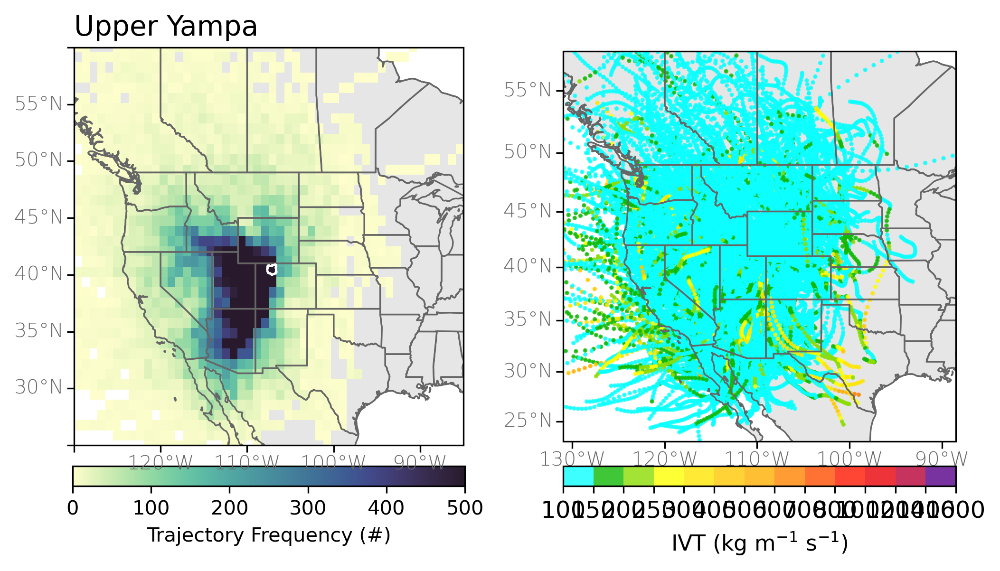

In [23]:
nrows = 2
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 0.05], width_ratios = [1, 1], wspace=0.25, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(8.0, 4.0))
fig.dpi = 300
fname = path_to_figs + 'ARScale_trajectory-IVT_heatmaps_noAR_Upper_Yampa'
fmt = 'png'
#####################
### PLOT HEATMAPS ###
#####################
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in
ext = [-130., -85., 25., 60.]
# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

# Add color bar axis
cbax = plt.subplot(gs[1,0]) # colorbar axis

row_idx = [0]
col_idx = [0]
llat_lst = [True]
for i, cell2 in enumerate(cell_lst2):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy,left_lats=llat_lst[i], right_lats=False)
    

    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
    ax.set_title(HUC8_lbl, loc='left', fontsize=14)

    ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    cf = cell2.plot(ax=ax, column='n_traj', cmap=cmo.deep, vmin=0, vmax=500, edgecolor=None, legend=True, cax=cbax,
                  legend_kwds={"label": "Trajectory Frequency (#)", "orientation": "horizontal"})

    ## add in four focus watersheds
    polys.plot(ax=ax, edgecolor='white', color='None', zorder=99)

    ax.set_extent(ext, datacrs)

############################
### PLOT IVT VALUES ###
############################
mapcrs = ccrs.Miller()
ext = [-131., -88.5, 23., 58.]

## OUTER LOOP - loop through different watersheds
# # need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)

ax = fig.add_subplot(gs[0, 1], projection=mapcrs)
ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False)
ax.set_extent(ext, datacrs)

ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
AR = ds.where(ds.ar_scale == 0, drop=True)
# need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)
nevents = len(AR.start_date)
## Add different points
for i in range(nevents):
    data = AR.isel(start_date=i)
    y_lst = data.lat.values
    x_lst = data.lon.values
    z_lst = data.IVT.values
    # ax.plot(x_lst, y_lst, c='gray', transform=datacrs, alpha=0.2)
    cmap, norm, bnds = ccmaps.cmap('ivt')
    cf = ax.scatter(x_lst, y_lst, c=z_lst, cmap=cmap, norm=norm, marker='.', transform=datacrs, alpha=0.8, s=6)

# Add color bar
cbarticks = [100, 150, 200, 250, 300, 400, 500, 600, 700, 800, 1000, 1200, 1400, 1600]
cbax = plt.subplot(gs[1,1]) # colorbar axis
cb = Colorbar(ax = cbax, mappable = cf, orientation = 'horizontal', ticklocation = 'bottom', ticks=cbarticks)
cb.set_label('IVT (kg m$^{-1}$ s$^{-1}$)', fontsize=11)
cb.ax.tick_params(labelsize=12)

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

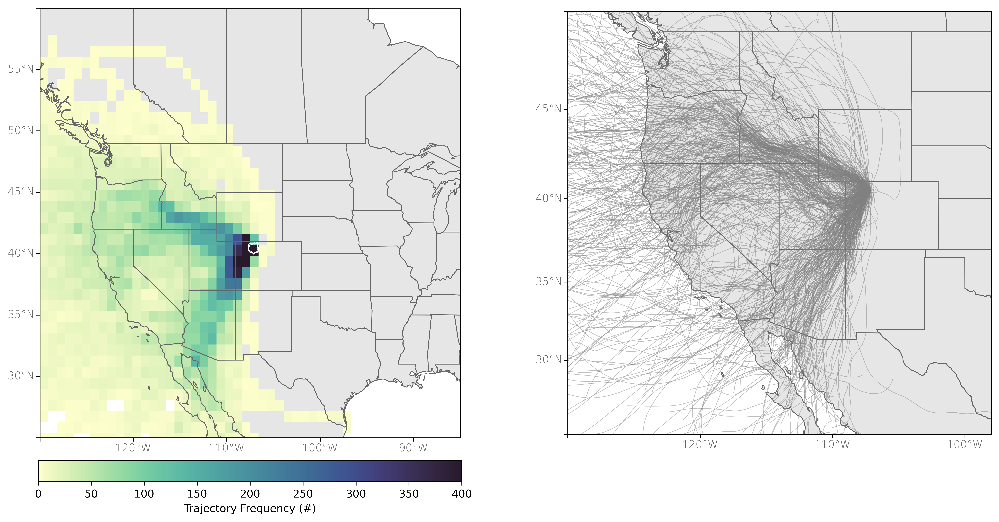

In [32]:
nrows = 2
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 0.05], width_ratios = [1, 1], wspace=0.25, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(16.0, 8.0))
fig.dpi = 600
fname = path_to_figs + 'ARScale_trajectory_heatmaps_yesAR_Upper_Yampa'

#####################
### PLOT HEATMAPS ###
#####################
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in
ext = [-130., -85., 25., 60.] 
# Add color bar axis
cbax = plt.subplot(gs[1,0]) # colorbar axis

row_idx = [0]
col_idx = [0]
llat_lst = [True]
for i, cell in enumerate(cell_lst):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy,left_lats=llat_lst[i], right_lats=False)
    

    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
    
    ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    cf = cell.plot(ax=ax, column='n_traj', cmap=cmo.deep, vmin=0, vmax=400, edgecolor=None, legend=True, cax=cbax,
                  legend_kwds={"label": "Trajectory Frequency (#)", "orientation": "horizontal"})

    ## add in four focus watersheds
    polys.plot(ax=ax, edgecolor='white', color='None', zorder=99)

    ax.set_extent(ext, datacrs)

############################
### PLOT AR SCALE VALUES ###
############################
mapcrs = ccrs.Mercator()
ext = [-130., -98., 25., 50.] 
colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']

## OUTER LOOP - loop through different watersheds
# # need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)

ax = fig.add_subplot(gs[0, 1], projection=mapcrs)
# ax.set_title(HUC8_lbls[k], loc='left', fontsize=14)
ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False)
ax.set_extent(ext, datacrs)
ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
AR = ds.where(ds.ar_scale > 0, drop=True)
# need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)
nevents = len(AR.start_date)
## Add different points
for i in range(nevents):
    data = AR.isel(start_date=i)
    y_lst = data.lat.values
    x_lst = data.lon.values
    z_lst = data.IVT.values
    ax.plot(x_lst, y_lst, c='gray', transform=datacrs, alpha=0.5, linewidth=0.5)
    cmap, norm, bnds = ccmaps.cmap('ivt')
    # cf = ax.scatter(x_lst, y_lst, c=z_lst, cmap=cmap, norm=norm, marker='.', transform=datacrs, alpha=0.8, s=6)

# # Add color bar
# cbarticks = [100, 200, 300, 500, 700, 1000, 1400, 1600]
# cbax = plt.subplot(gs[1,1]) # colorbar axis
# cb = Colorbar(ax = cbax, mappable = cf, orientation = 'horizontal', ticklocation = 'bottom')
# cb.set_label('IVT (kg m$^{-1}$ s$^{-1}$)', fontsize=11)
# cb.ax.tick_params(labelsize=12)
# ## INNER LOOP - Loop through AR scale values
# for j in range(1, 6):
#     try:
#         AR = ds.where(ds.ar_scale == j, drop=True)
#         nevents = len(AR.start_date)
#         print('j', j, nevents)
#         ## LOOP THROUGH TRAJECTORIES
#         for i in range(nevents):
#             data = AR.isel(start_date=i)
#             y_lst = data.lat.values
#             x_lst = data.lon.values
#             ax.plot(x_lst, y_lst, c=colors[j], transform=datacrs, alpha=0.2)
#             cf = ax.scatter(x_lst, y_lst, c=colors[j], marker='.', transform=datacrs, alpha=0.7, s=6)
#     except IndexError:
#         pass

# # # Add color bar
# cbax = plt.subplot(gs[1,-1]) # colorbar axis
# plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()